In [6]:
#loading the libraries we need:numpy,scipy,matplotlib
import numpy as np
import scipy
import imageio
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")


In [7]:
#lets choose a WIFIRE satellite image file as an array and display  its type
from skimage import data
photo_data=imageio.imread("sd-3layers.jpg")
type(photo_data)

numpy.ndarray

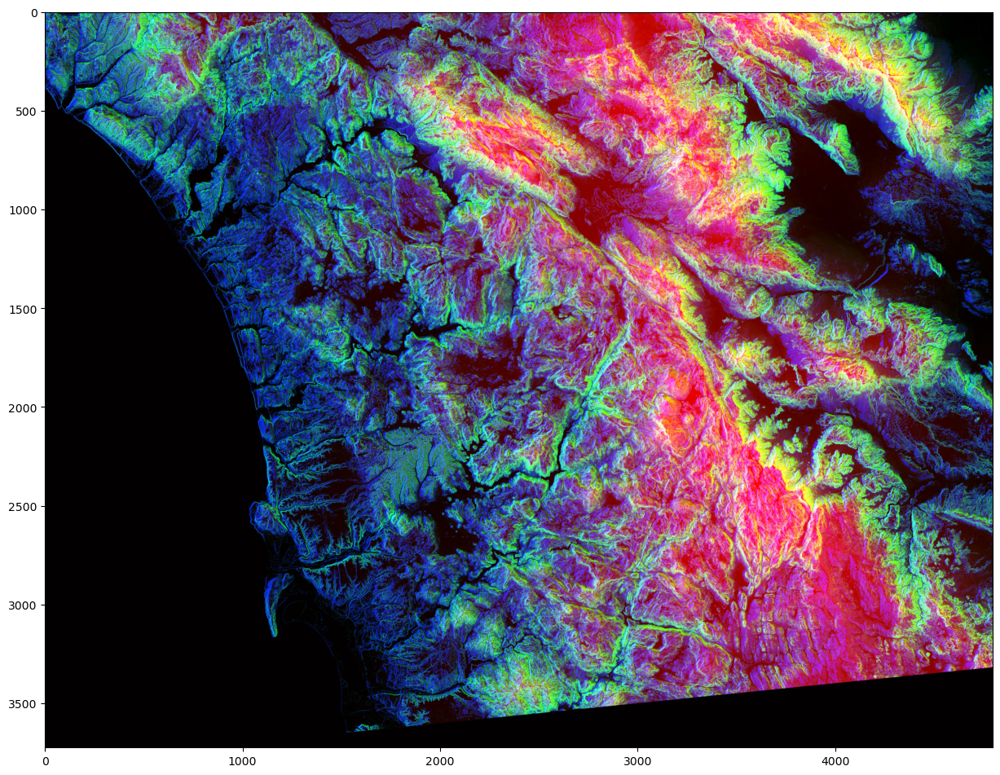

In [8]:
#lets see this image
plt.figure(figsize=(15,15))
plt.imshow(photo_data)
plt.show()

In [10]:
#print shape of photo_data
print(photo_data.shape)

(3725, 4797, 3)


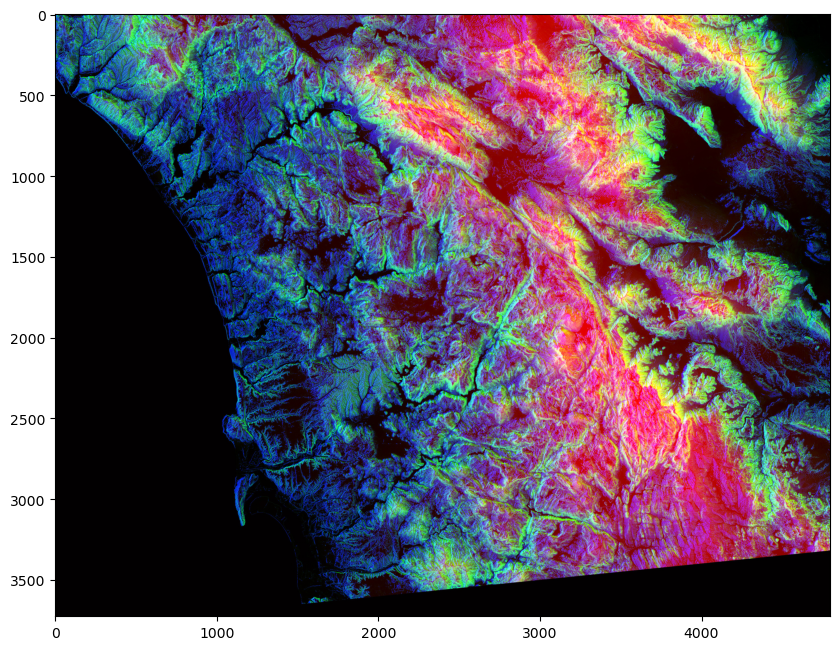

In [11]:
#color mapping in the photo 
#red-pixel indicates altitude
#blue pixel indicates aspect
#green pixel indicates slope
photo_data.size
photo_data.min(),photo_data.max()
photo_data.mean

#pixel on the 150th row and 250th column:
photo_data[150, 250]
photo_data[150,250,1]# its print green values
#pixel on the 2nd row and 2nd column:
photo_data[1, 1]#it will print the red,green,blue value in order
photo_data=imageio.imread("sd-3layers.jpg")
photo_data[150, 250]= 0 #we set all three layers of RGB of this
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()




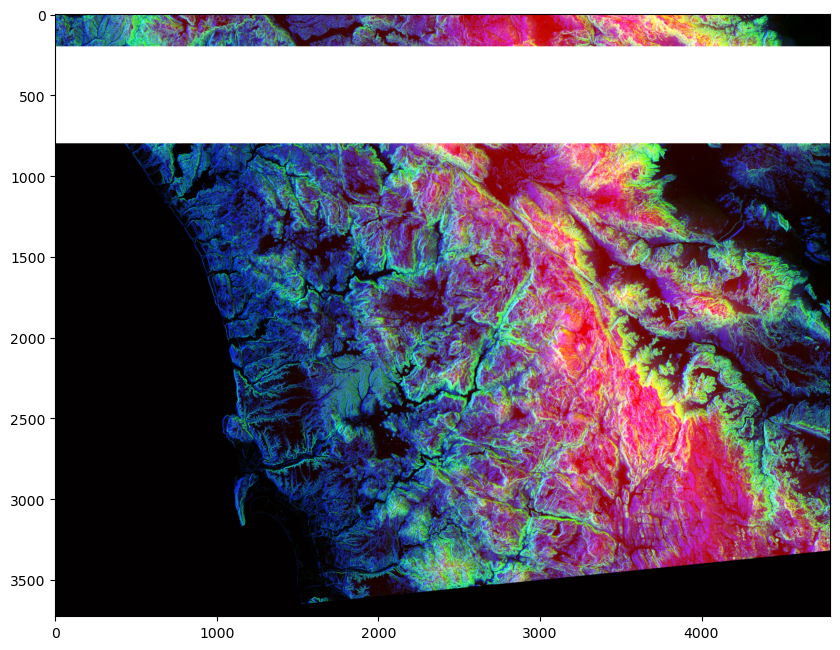

In [12]:
#changing color in range
# change the pixel values
photo_data=imageio.imread("sd-3layers.jpg")
photo_data[200:800, :]=255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()


shape of photo_data: (3725, 4797, 3)
shape of low_value_filter: (3725, 4797, 3)


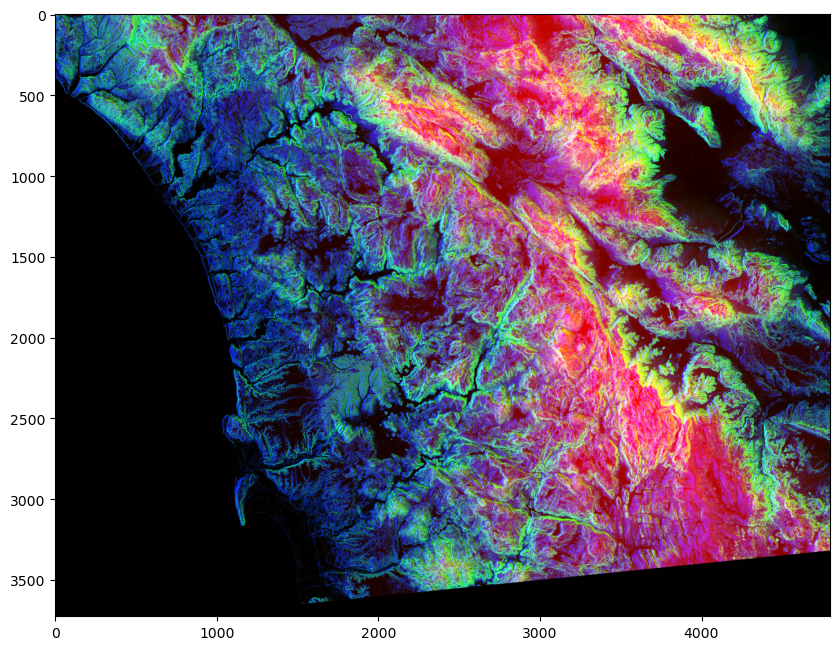

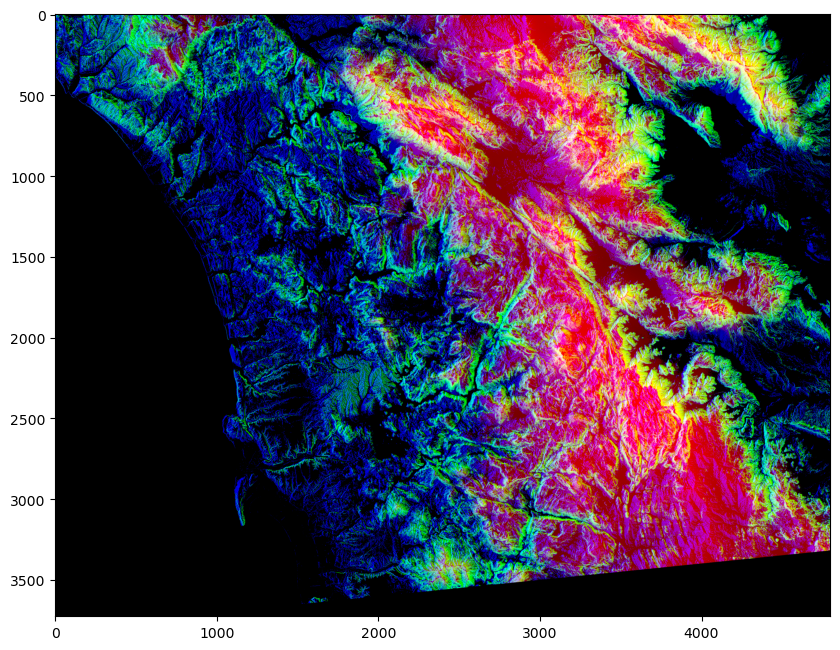

In [14]:
#pick all pixels with low values:
photo_data = imageio.imread("sd-3layers.jpg")
print("shape of photo_data:", photo_data.shape)
low_value_filter =photo_data<100
print("shape of low_value_filter:",low_value_filter.shape)

#filtering out low values
#whenever the low_value_filter is True, set low values to 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)
photo_data[low_value_filter]= 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)
plt.show()

In [15]:
#more row and column operations
#design complex patterns by making columns a function
# linear relationship between row and columns
rows_range = np.arange(len(photo_data)) #create a range array
print(rows_range)
cols_range = rows_range 
print(cols_range)
print(type(rows_range))

[   0    1    2 ... 3722 3723 3724]
[   0    1    2 ... 3722 3723 3724]
<class 'numpy.ndarray'>


[[[255 255 255]
  [  0   0   0]
  [  0   0 128]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0 109]
  [255 255 255]
  [  0   0 157]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0 155]
  [  0   0 174]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]


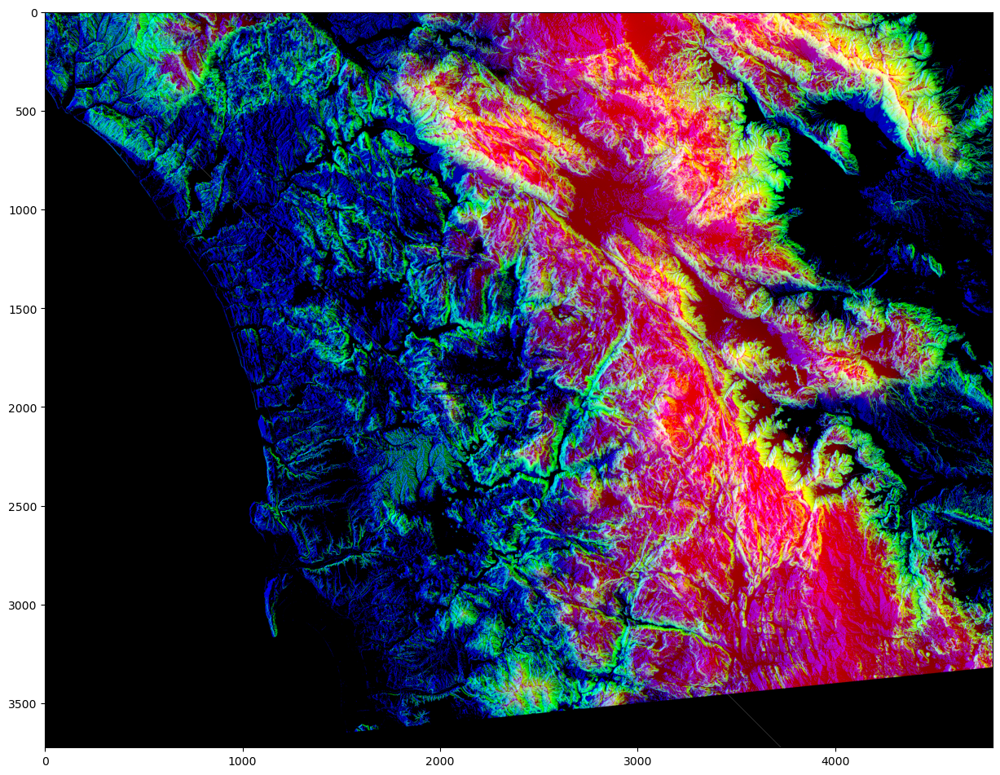

In [16]:
#selected rows and columns to the maximum values of 255
photo_data[rows_range, cols_range] = 255
print(photo_data)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)
plt.show()



In [23]:
# masking images
#now let us try to mask the image in shape of a circular disc.
total_rows, total_cols,total_layers = photo_data.shape
print("photo_data=", photo_data.shape)
X, y = np.ogrid[:total_rows, :total_cols]
print("X =",X.shape, " and y =",y.shape)
from IPython.display import Image
Image("images/figure.png")
center_row, center_col = total_rows /2, total_cols /2
print("center_row =", center_row, "AND center_cols =", center_col)
print(X - center_row)
print(y - center_col)

photo_data= (3725, 4797, 3)
X = (3725, 1)  and y = (1, 4797)
center_row = 1862.5 AND center_cols = 2398.5
[[-1862.5]
 [-1861.5]
 [-1860.5]
 ...
 [ 1859.5]
 [ 1860.5]
 [ 1861.5]]
[[-2398.5 -2397.5 -2396.5 ...  2395.5  2396.5  2397.5]]


In [24]:
dist_from_center = (X - center_row)**2 + (y - center_col)**2
print(dist_from_center)

[[9221708.5 9216912.5 9212118.5 ... 9207326.5 9212118.5 9216912.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 ...
 [9210542.5 9205746.5 9200952.5 ... 9196160.5 9200952.5 9205746.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]]


In [25]:
radius = (total_rows / 2)**2
print("Radius=",radius)

Radius= 3468906.25


In [26]:
circular_mask = (dist_from_center > radius)
print(circular_mask)

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


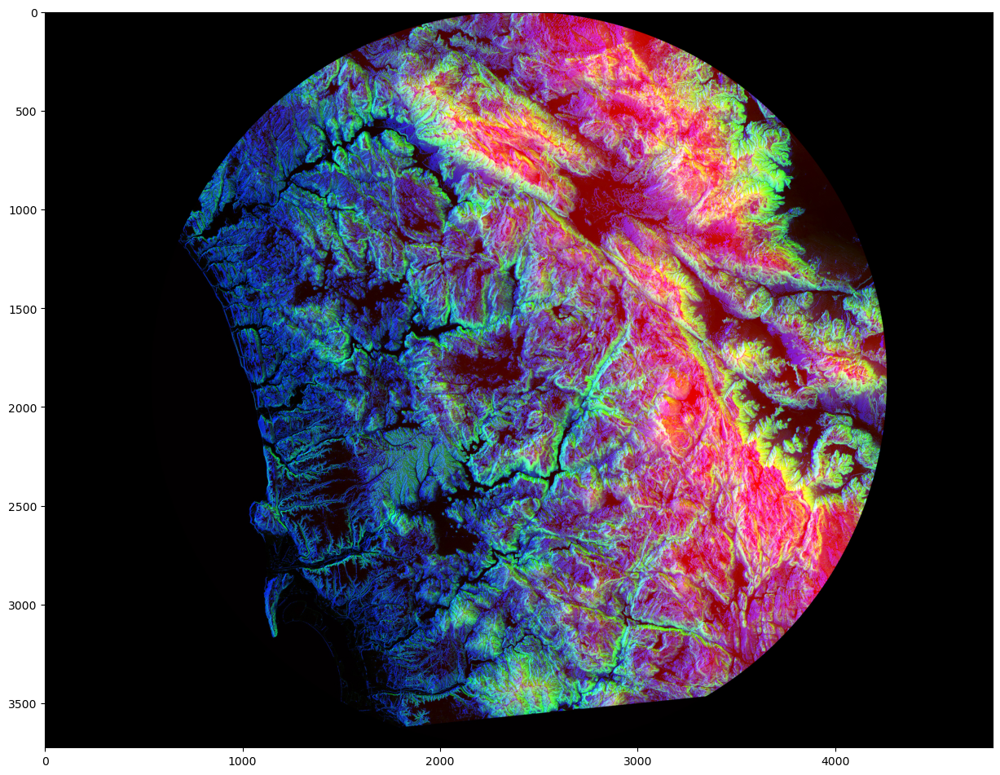

In [27]:
print(circular_mask[1500:1700,2000:2200])
photo_data = imageio.imread("sd-3layers.jpg")
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

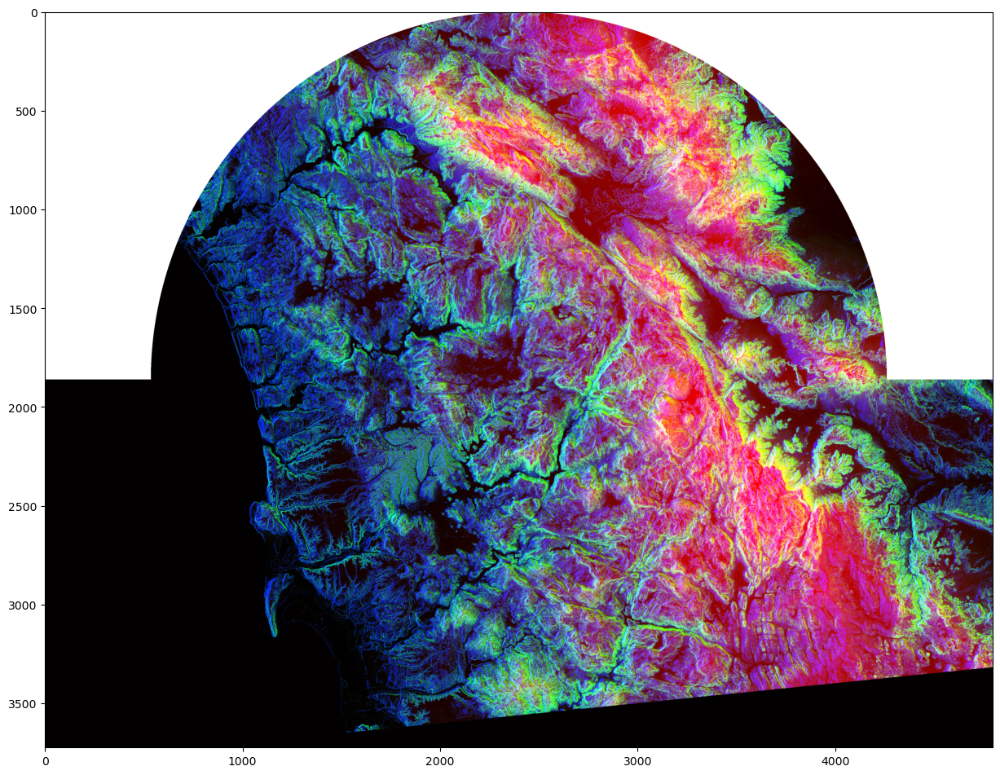

In [28]:
#further masking
X,y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row
half_upper_mask = np.logical_and(half_upper, circular_mask)
photo_data = imageio.imread("sd-3layers.jpg")
photo_data[half_upper_mask] = 255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)
plt.show()